In [16]:
import os
import sys
sys.path.append("./models")
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
from PIL import Image
import torch
import torch.nn.functional as F

from models.llava.constants import IMAGE_TOKEN_INDEX, DEFAULT_IMAGE_TOKEN, DEFAULT_IM_START_TOKEN, DEFAULT_IM_END_TOKEN
from models.llava.conversation import conv_templates, SeparatorStyle
from models.llava.model.builder import load_pretrained_model
from models.llava.utils import disable_torch_init
from models.llava.mm_utils import process_images, tokenizer_image_token, get_model_name_from_path

from utils import (
    load_image, 
    aggregate_llm_attention, aggregate_vit_attention,
    heterogenous_stack,
    show_mask_on_image
)

In [17]:
import os
# 当前 Python 进程中设置 HTTP/HTTPS 代理
# Set the HTTP/HTTPS proxy in the current Python process
os.environ["http_proxy"] = "http://127.0.0.1:7890"
os.environ["https_proxy"] = "http://127.0.0.1:7890"
model_path = "liuhaotian/llava-v1.5-7b"

# 加载指定模型
# load the model
load_8bit = False
load_4bit = False
device = "cuda" if torch.cuda.is_available() else "cpu"
disable_torch_init()
model_name = get_model_name_from_path(model_path)
tokenizer, model, image_processor, context_len = load_pretrained_model(
    model_path, 
    None, # model_base
    model_name, 
    load_8bit, 
    load_4bit, 
    device=device
)

You are using a model of type llava to instantiate a model of type llava_llama. This is not supported for all configurations of models and can yield errors.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

KeyboardInterrupt: 

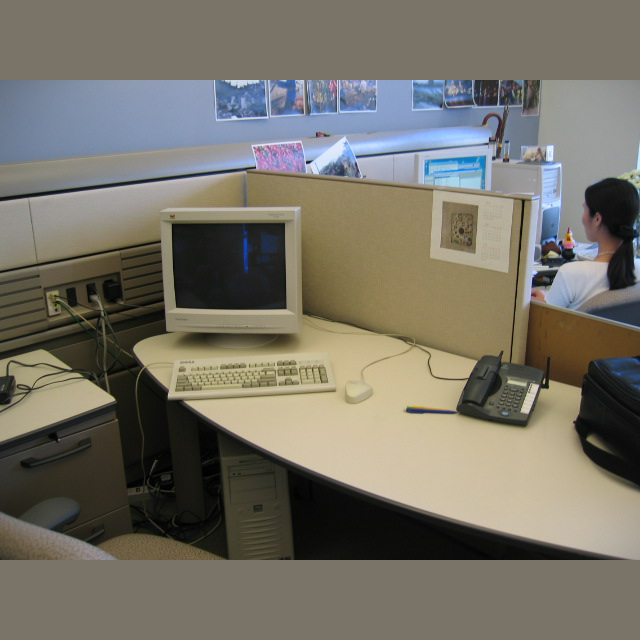

Please describe this image in detail.


In [ ]:
image_path_or_url = "../image/3.jpg"
prompt_text = "Please describe this image in detail."
if "llama-2" in model_name.lower():
    conv_mode = "llava_llama_2"
elif "mistral" in model_name.lower():
    conv_mode = "mistral_instruct"
elif "v1.6-34b" in model_name.lower():
    conv_mode = "chatml_direct"
elif "v1" in model_name.lower():
    conv_mode = "llava_v1"
elif "mpt" in model_name.lower():
    conv_mode = "mpt"
else:
    conv_mode = "llava_v0"

conv = conv_templates[conv_mode].copy()
if "mpt" in model_name.lower():
    roles = ('user', 'assistant')
else:
    roles = conv.roles

image = load_image(image_path_or_url)
image_tensor, images = process_images([image], image_processor, model.config)
image = images[0]
image_size = image.size
if type(image_tensor) is list:
    image_tensor = [image.to(model.device, dtype=torch.float16) for image in image_tensor]
else:
    image_tensor = image_tensor.to(model.device, dtype=torch.float16)

if model.config.mm_use_im_start_end:
    inp = DEFAULT_IM_START_TOKEN + DEFAULT_IMAGE_TOKEN + DEFAULT_IM_END_TOKEN + '\n' + prompt_text
else:
    inp = DEFAULT_IMAGE_TOKEN + '\n' + prompt_text

conv.append_message(conv.roles[0], inp)
conv.append_message(conv.roles[1], None)
prompt = conv.get_prompt()

# 更改系统提示词（可选）
# Modify the system prompt (optional)
prompt = prompt.replace(
    "A chat between a curious human and an artificial intelligence assistant. The assistant gives helpful, detailed, and polite answers to the human's questions. ",
    ""
)

input_ids = tokenizer_image_token(prompt, tokenizer, IMAGE_TOKEN_INDEX, return_tensors='pt').unsqueeze(0).to(model.device)

# 展示图像与提示词
# Display the image and the prompt
display(image)
print(prompt_text)

In [ ]:
# 在不计算梯度的情况下，对输入的文本 + 图像进行生成式推理，并返回生成的 tokens、注意力、隐藏状态等信息
# Perform generative inference on the input text and image without computing gradients, and return the generated tokens, attention maps, and hidden states
with torch.inference_mode():
    outputs = model.generate(
        input_ids,
        images=image_tensor,
        image_sizes=[image_size],
        do_sample=True,
        max_new_tokens=512,
        use_cache=True,
        return_dict_in_generate=True,
        output_attentions=True,
        output_hidden_states=True,
        temperature=0.7,
    )

text = tokenizer.decode(outputs["sequences"][0]).strip()
print(text)

`torch.nn.functional.scaled_dot_product_attention` does not support `output_attentions=True`. Falling back to eager attention. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.
`torch.nn.functional.scaled_dot_product_attention` does not support `output_attentions=True`. Falling back to eager attention. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


The image depicts an office setting with multiple desks and cubicles. Each cubicle features a monitor on a desk, indicating the presence of computers and technology. In addition to the computer monitors, there is a keyboard and a mouse present on each desk.

Two people can be seen in the office, with one person located on the left side of the room and the other person on the right side. Both individuals appear to be engaged in their work or conversing with others in their cubicles.

There are also several books scattered throughout the office, suggesting that the employees may be reading or referencing materials as part of their work.</s>


Number of Transformer layers: 32
Shape of attention in a single layer: torch.Size([1, 32, 595, 595])


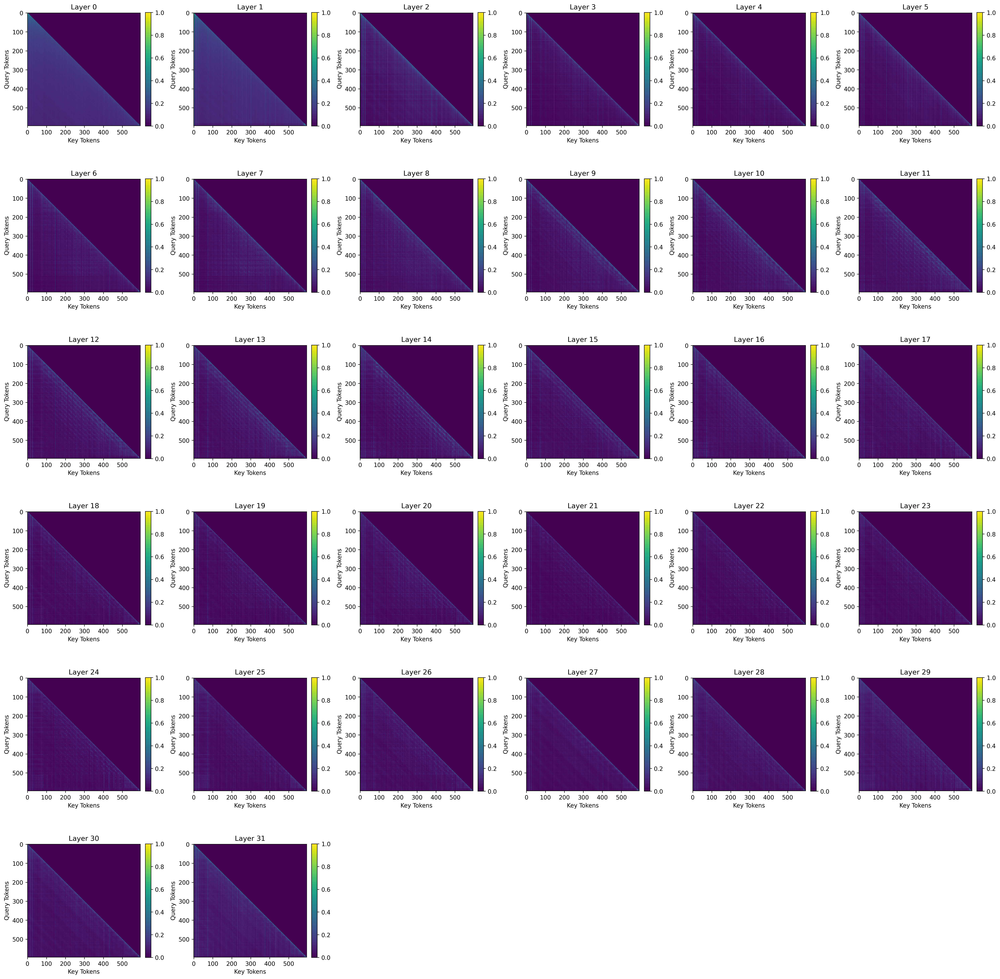

In [ ]:
# 可视化全序列所有层的注意力图
# Visualize the attention maps of all layers across the entire sequence
import numpy as np
import matplotlib.pyplot as plt

attentions = outputs["attentions"][0]  
num_layers = len(attentions)
print(f"Number of Transformer layers: {num_layers}")

first_layer_attn = attentions[0]
print("Shape of attention in a single layer:", first_layer_attn.shape)

# 在 attention 可视化前，将非首 token（第 1 行及之后）对 <bos> 的注意力置零
# Before visualizing attention, set the attention weights from all non-first tokens (rows 1 and onward) to the <bos> token to zero
# def normalize_attention(attn_matrix):
#     cur = attn_matrix[:-1].cpu().clone()
#     cur[1:, 0] = 0.
#     return cur

gamma_factor =3

cols = int(np.ceil(np.sqrt(num_layers)))
rows = int(np.ceil(num_layers / cols))

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4), dpi=250)

if rows == 1:
    axes = axes.reshape(1, -1)
elif cols == 1:
    axes = axes.reshape(-1, 1)

for layer_idx in range(num_layers):
    row = layer_idx // cols
    col = layer_idx % cols
    
    layer_attn = attentions[layer_idx].squeeze(0)  
    mean_attn = layer_attn.mean(dim=0) 
    enhanced_attn = np.power(mean_attn.cpu().numpy(), 1 / gamma_factor)

    # 去除 attention sink 干扰（可选）
    # Remove attention sink interference (optional)
    # norm_attn = normalize_attention(mean_attn)
    # enhanced_attn = np.power(norm_attn.numpy(), 1 / gamma_factor)
    
    ax = axes[row, col]
    im = ax.imshow(enhanced_attn, 
                   vmin=enhanced_attn.min(), 
                   vmax=enhanced_attn.max(), 
                   interpolation="nearest",
                   cmap='viridis')  
    
    ax.set_title(f"Layer {layer_idx}")
    ax.set_xlabel("Key Tokens")
    ax.set_ylabel("Query Tokens")
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

for i in range(num_layers, rows * cols):
    row = i // cols
    col = i % cols
    axes[row, col].set_visible(False)

plt.tight_layout()
plt.show()

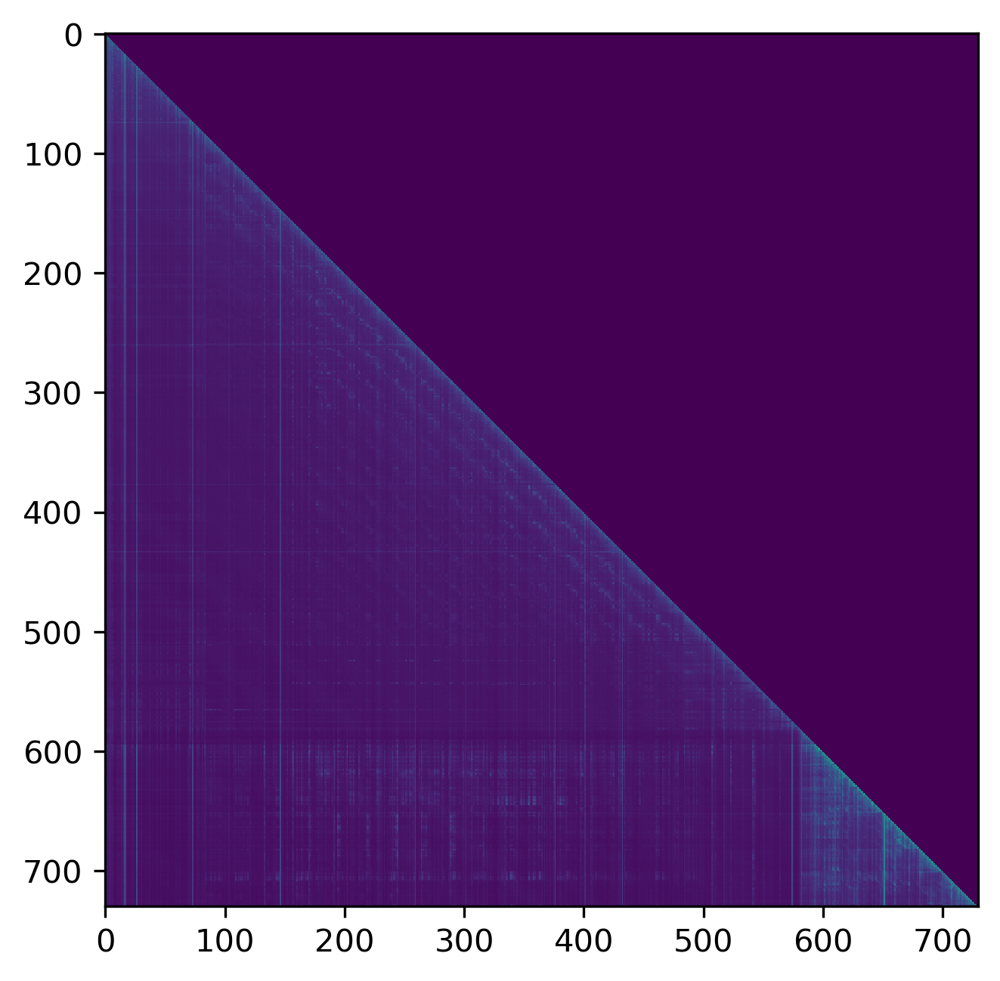

In [ ]:
# 各层各个头求平均后的注意力图
# Attention maps averaged over all heads in each layer
aggregated_prompt_attention = []
for i, layer in enumerate(outputs["attentions"][0]):
    layer_attns = layer.squeeze(0)
    attns_per_head = layer_attns.mean(dim=0)
    cur = attns_per_head[:-1].cpu().clone()
    # 去除 attention sink 干扰（可选）
    # Remove attention sink interference (optional)    
    # cur = attns_per_head[:-1].cpu().clone()
    # cur[1:, 0] = 0.
    # cur[1:] = cur[1:] / cur[1:].sum(-1, keepdim=True)
    aggregated_prompt_attention.append(cur)
aggregated_prompt_attention = torch.stack(aggregated_prompt_attention).mean(dim=0)

llm_attn_matrix = heterogenous_stack(
    [torch.tensor([1])]
    + list(aggregated_prompt_attention) 
    + list(map(aggregate_llm_attention, outputs["attentions"]))
)

gamma_factor = 3
enhanced_attn_m = np.power(llm_attn_matrix.numpy(), 1 / gamma_factor)
fig, ax = plt.subplots(figsize=(5, 5), dpi=300)
ax.imshow(enhanced_attn_m, vmin=enhanced_attn_m.min(), vmax=enhanced_attn_m.max(), interpolation="nearest")
plt.show()

Number of Transformer layers: 32


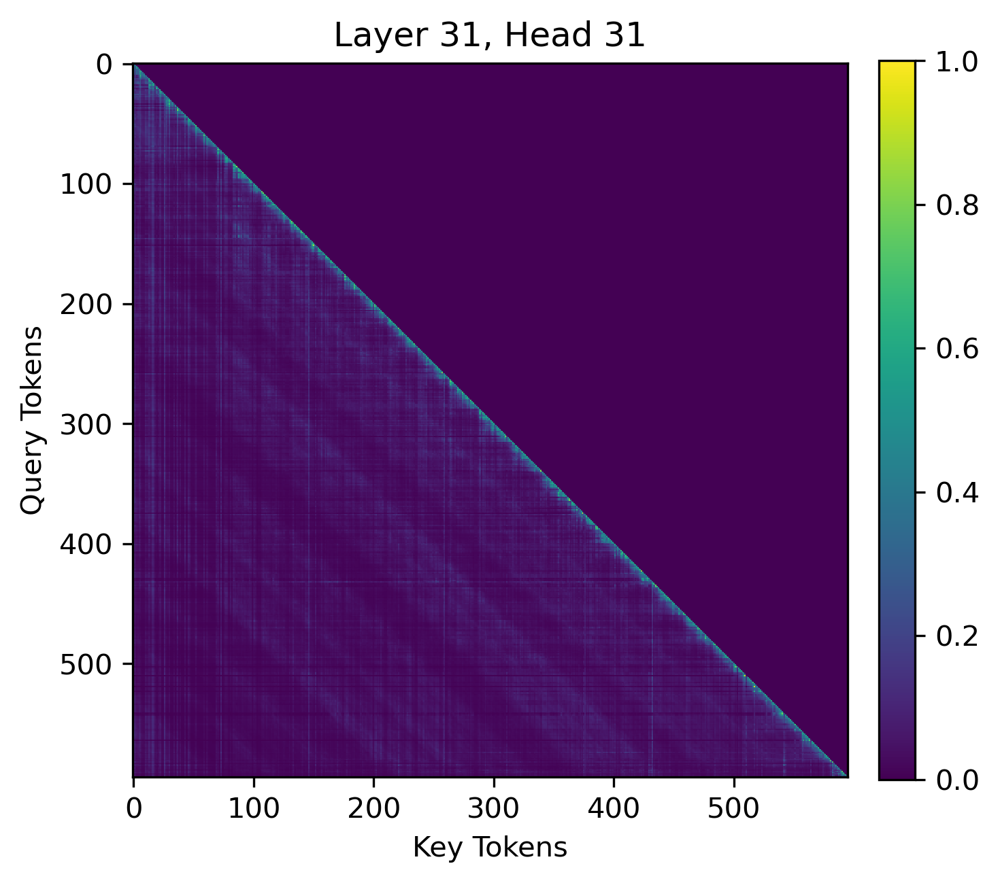

In [ ]:
# 可视化指定层、指定头的注意力图
# Visualize the attention map of a specified layer and a specified head
import numpy as np
import matplotlib.pyplot as plt

attentions = outputs["attentions"][0]  
num_layers = len(attentions)
print(f"Number of Transformer layers: {num_layers}")

TARGET_LAYER = 31  
TARGET_HEAD  = 31  

layer_attn = attentions[TARGET_LAYER].squeeze(0)      
head_attn = layer_attn[TARGET_HEAD]                     

gamma_factor = 3
enhanced_attn = np.power(head_attn.cpu().numpy(), 1 / gamma_factor)

fig, ax = plt.subplots(figsize=(5, 5), dpi=300)
im = ax.imshow(
    enhanced_attn,
    vmin=enhanced_attn.min(),
    vmax=enhanced_attn.max(),
    interpolation="nearest",
    cmap='viridis'
)

ax.set_title(f"Layer {TARGET_LAYER}, Head {TARGET_HEAD}")
ax.set_xlabel("Key Tokens")
ax.set_ylabel("Query Tokens")
fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()


Original token length: 135
Attention matrix shape: torch.Size([730, 730])
Modified attention map shape: torch.Size([135, 135])


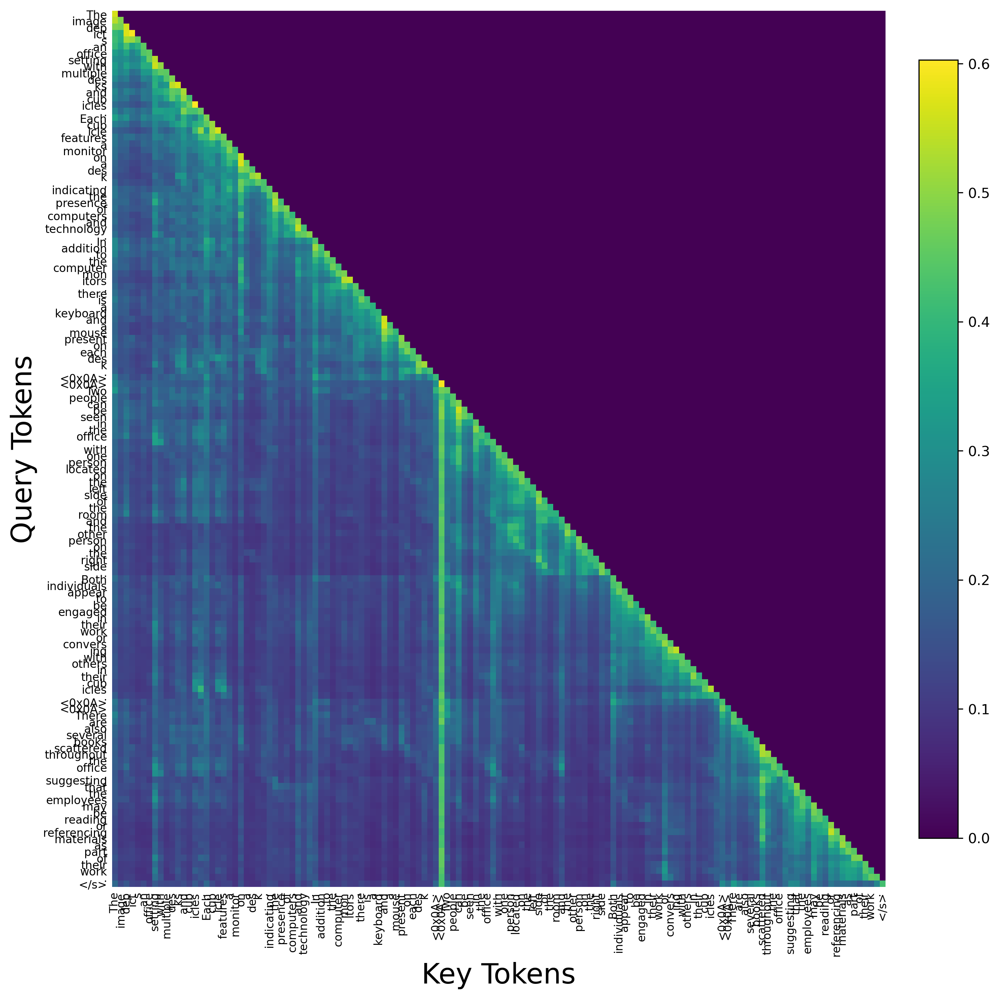

In [ ]:
# 输出token的注意力图可视化
# Attention visualization for output tokens
import matplotlib.pyplot as plt
import numpy as np

output_token_ids = outputs["sequences"][0]
output_token_len = len(output_token_ids)

print(f"Original token length: {output_token_len}")
print(f"Attention matrix shape: {llm_attn_matrix.shape}")
output_attn_map = llm_attn_matrix[-output_token_len:, -output_token_len-1:-1]
print(f"Modified attention map shape: {output_attn_map.shape}")

gamma_factor = 3.0
enhanced_attn = np.power(output_attn_map.numpy(), 1 / gamma_factor)


enhanced_attn_masked = enhanced_attn  

tokens_raw = tokenizer.convert_ids_to_tokens(output_token_ids)
output_token_labels = [
    tok.replace("\n", "\\n")
       .replace("Ċ", "\\n")
       .replace("▁", "")  
    for tok in tokens_raw
]


fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
cmap = plt.cm.viridis.copy()
cmap.set_bad(alpha=0.0)

im = ax.imshow(enhanced_attn_masked, interpolation="nearest",
               aspect='auto', cmap=cmap)

ax.set_xticks(range(output_token_len))
ax.set_yticks(range(output_token_len))
ax.set_xticklabels(output_token_labels, rotation=90, fontsize=7)
ax.set_yticklabels(output_token_labels, fontsize=7)

for i, label in enumerate(output_token_labels):
    if "\\n" in label:
        ax.get_xticklabels()[i].set_color("red")
        ax.get_yticklabels()[i].set_color("red")

for spine in ax.spines.values():
    spine.set_visible(False)
ax.tick_params(length=0)

ax.set_xlabel("Key Tokens", fontsize=14)
ax.set_ylabel("Query Tokens", fontsize=14)

ax.set_xticks(range(output_token_len))
ax.set_xticklabels(output_token_labels, rotation=90, fontsize=8)
ax.set_yticks(range(output_token_len))
ax.set_yticklabels(output_token_labels, fontsize=8)
ax.set_xlabel("Key Tokens", fontsize=20)
ax.set_ylabel("Query Tokens", fontsize=20)

plt.colorbar(im, fraction=0.046, pad=0.04)
plt.tight_layout()
plt.show()

In [ ]:
# 识别 token 的长度或索引
# identify length or index of tokens
input_token_len = model.get_vision_tower().num_patches + len(input_ids[0]) - 1 
vision_token_start = len(tokenizer(prompt.split("<image>")[0], return_tensors='pt')["input_ids"][0])
vision_token_end = vision_token_start + model.get_vision_tower().num_patches
output_token_len = len(outputs["sequences"][0])
output_token_start = input_token_len
output_token_end = input_token_len + output_token_len

595 The             0.4207
596 image           0.4508
597 dep             0.3436
598 ict             0.3039
599 s               0.3134
600 an              0.4398
601 office          0.5141
602 setting         0.4817
603 with            0.3392
604 multiple        0.4736
605 des             0.5201
606 ks              0.4156
607 and             0.3521
608 cub             0.3970
609 icles           0.3785
610 .               0.2792
611 Each            0.3139
612 cub             0.3076
613 icle            0.2624
614 features        0.2736
615 a               0.4002
616 monitor         0.4284
617 on              0.3737
618 a               0.3464
619 des             0.4037
620 k               0.2879
621 ,               0.2541
622 indicating      0.2813
623 the             0.2666
624 presence        0.2456
625 of              0.2572
626 computers       0.2952
627 and             0.2456
628 technology      0.2679
629 .               0.2171
630 In              0.2970
631 addition        0.2709
6

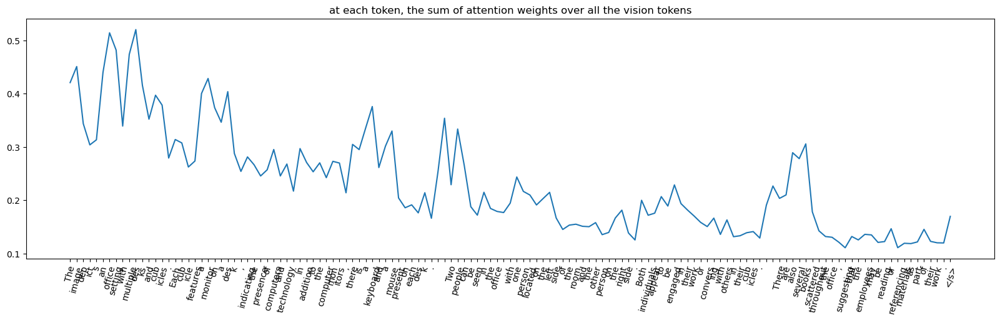

In [ ]:
# 视觉token对输出token的注意力总和变化
# Changes in the total attention from visual tokens to output tokens
overall_attn_weights_over_vis_tokens = []
for i, (row, token) in enumerate(
    zip(
        llm_attn_matrix[input_token_len:], 
        outputs["sequences"][0].tolist()
    )
):
    print(
        i + input_token_len, 
        f"{tokenizer.decode(token, add_special_tokens=False).strip():<15}", 
        f"{row[vision_token_start:vision_token_end].sum().item():.4f}"
    )
    overall_attn_weights_over_vis_tokens.append(
        row[vision_token_start:vision_token_end].sum().item()
    )

fig, ax = plt.subplots(figsize=(20, 5))
ax.plot(overall_attn_weights_over_vis_tokens)
ax.set_xticks(range(len(overall_attn_weights_over_vis_tokens)))
ax.set_xticklabels(
    [tokenizer.decode(token, add_special_tokens=False).strip() for token in outputs["sequences"][0].tolist()],
    rotation=75
)
ax.set_title("at each token, the sum of attention weights over all the vision tokens");
plt.show()

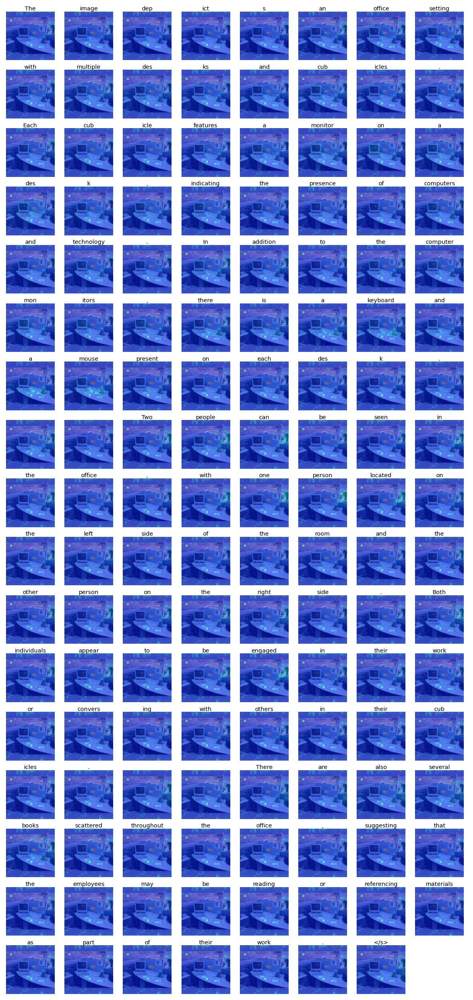

In [ ]:
# 视觉token对输出token的注意力映射回原图
# Mapping the attention from visual tokens to output tokens back to the original image
vis_attn_matrix = aggregate_vit_attention(
    model.get_vision_tower().image_attentions,
    select_layer=model.get_vision_tower().select_layer,
    all_prev_layers=True
)
grid_size = model.get_vision_tower().num_patches_per_side

num_image_per_row = 8
image_ratio = image_size[0] / image_size[1]
num_rows = output_token_len // num_image_per_row + (1 if output_token_len % num_image_per_row != 0 else 0)
fig, axes = plt.subplots(
    num_rows, num_image_per_row, 
    figsize=(10, (10 / num_image_per_row) * image_ratio * num_rows), 
    dpi=150
)
plt.subplots_adjust(wspace=0.05, hspace=0.2)
vis_overlayed_with_attn = True

output_token_inds = list(range(output_token_start, output_token_end))
for i, ax in enumerate(axes.flatten()):
    if i >= output_token_len:
        ax.axis("off")
        continue

    target_token_ind = output_token_inds[i]
    attn_weights_over_vis_tokens = llm_attn_matrix[target_token_ind][vision_token_start:vision_token_end]
    attn_weights_over_vis_tokens = attn_weights_over_vis_tokens / attn_weights_over_vis_tokens.sum()

    attn_over_image = []
    for weight, vis_attn in zip(attn_weights_over_vis_tokens, vis_attn_matrix):
        vis_attn = vis_attn.reshape(grid_size, grid_size)
        # vis_attn = vis_attn / vis_attn.max()
        attn_over_image.append(vis_attn * weight)
    attn_over_image = torch.stack(attn_over_image).sum(dim=0)
    attn_over_image = attn_over_image / attn_over_image.max()

    attn_over_image = F.interpolate(
        attn_over_image.unsqueeze(0).unsqueeze(0), 
        size=image.size, 
        mode='nearest', 
        # mode='bicubic', align_corners=False
    ).squeeze()

    np_img = np.array(image)[:, :, ::-1]
    img_with_attn, heatmap = show_mask_on_image(np_img, attn_over_image.numpy())
    ax.imshow(heatmap if not vis_overlayed_with_attn else img_with_attn)
    ax.set_title(
        tokenizer.decode(outputs["sequences"][0][i], add_special_tokens=False).strip(),
        fontsize=7,
        pad=1
    )
    ax.axis("off");
plt.show()

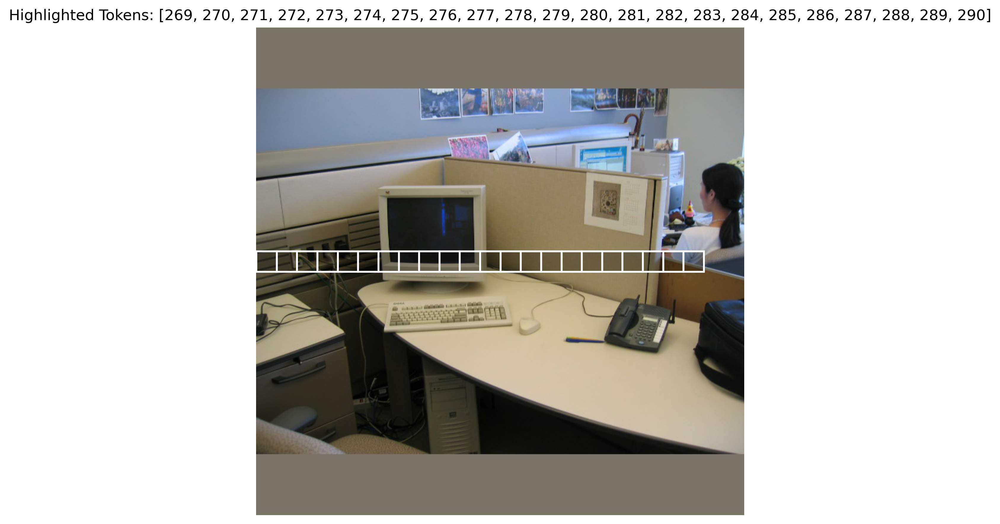

/tmp/ipykernel_253301/1119158847.py:157: UserWarning: Glyph 33394 (\N{CJK UNIFIED IDEOGRAPH-8272}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_253301/1119158847.py:157: UserWarning: Glyph 54924 (\N{HANGUL SYLLABLE HOE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_253301/1119158847.py:157: UserWarning: Glyph 21495 (\N{CJK UNIFIED IDEOGRAPH-53F7}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_253301/1119158847.py:157: UserWarning: Glyph 45224 (\N{HANGUL SYLLABLE NAM}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_253301/1119158847.py:157: UserWarning: Glyph 32622 (\N{CJK UNIFIED IDEOGRAPH-7F6E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_253301/1119158847.py:157: UserWarning: Glyph 28857 (\N{CJK UNIFIED IDEOGRAPH-70B9}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/home/sun/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarni

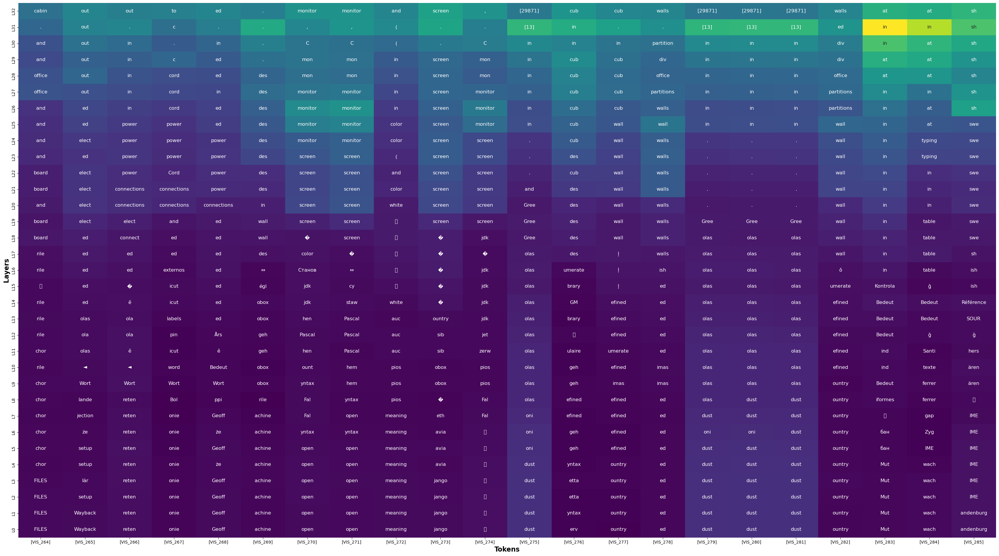

In [ ]:
# 视觉token在各层间的语义演化过程
# The semantic evolution of visual tokens across layers
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
import numpy as np
import torch
import torch.nn.functional as F

input_ids = outputs["sequences"] 
attentions = outputs["attentions"]  
hidden_states = outputs["hidden_states"]  
text_before_image = prompt.split("<image>")[0]
text_tokens = tokenizer(text_before_image, return_tensors="pt")["input_ids"][0]
vision_token_start = len(text_tokens)
vision_token_end = vision_token_start + model.get_vision_tower().num_patches
first_layer_attn = attentions[0][0].squeeze(0) 
mean_attn = first_layer_attn.mean(dim=0)   
lm_head = model.lm_head  
input_hidden_states = hidden_states[0] 


def visualize_tokens_and_layers(
    prompt, image, tokenizer, model, 
    input_hidden_states, lm_head,
    global_token_indices,
    save_heatmap=None
):
    text_before_image = prompt.split("<image>")[0]
    text_tokens = tokenizer(text_before_image, return_tensors="pt")["input_ids"][0]

    vision_token_start = len(text_tokens)
    num_patches = model.get_vision_tower().num_patches
    grid_size = model.get_vision_tower().num_patches_per_side
    vision_token_end = vision_token_start + num_patches


    highlight_visual_indices = []
    for g in global_token_indices:
        if vision_token_start <= g < vision_token_end:
            highlight_visual_indices.append(g - vision_token_start)

    highlight_visual_indices = [
        v for v in highlight_visual_indices if 0 <= v < num_patches
    ]

    if len(highlight_visual_indices) == 0:
        print("⚠️ Out of index range")
        return


    highlight_mask = np.zeros((grid_size, grid_size))

    for v in highlight_visual_indices:
        r = v // grid_size
        c = v % grid_size
        highlight_mask[r, c] = 1

    np_img = np.array(image)[:, :, ::-1]  
    highlight_resized = F.interpolate(
        torch.tensor(highlight_mask).unsqueeze(0).unsqueeze(0).float(),
        size=(np_img.shape[0], np_img.shape[1]),
        mode="nearest"
    ).squeeze().numpy()

    highlighted_image = np_img.copy()
    alpha = 0.3
    for i in range(3):
        highlighted_image[:, :, i] = np.where(
            highlight_resized > 0,
            (1 - alpha) * highlighted_image[:, :, i],
            highlighted_image[:, :, i]
        )


    patch_w = image.size[0] / grid_size
    patch_h = image.size[1] / grid_size

    plt.figure(figsize=(6, 6), dpi=300)
    plt.imshow(highlighted_image[:, :, ::-1])
    ax = plt.gca()

    for v in highlight_visual_indices:
        r = v // grid_size
        c = v % grid_size

        rect = patches.Rectangle(
            (c * patch_w, r * patch_h),
            patch_w, patch_h,
            linewidth=1.5,
            edgecolor="white",
            facecolor="none"
        )
        ax.add_patch(rect)

    plt.title(f"Highlighted Tokens: {global_token_indices}")
    plt.axis("off")
    plt.tight_layout()
    plt.show()


    heatmap_vals = []
    heatmap_tokens = []
    ylabels = []

    num_layers = len(input_hidden_states)

    for L in range(num_layers):
        layer_h = input_hidden_states[L][0] 

        row_vals = []
        row_toks = []
        for g_idx in global_token_indices:
            h = layer_h[g_idx]
            logits = lm_head(h)
            top1_v, top1_id = torch.max(logits, dim=-1)
            row_vals.append(top1_v.item())

            tok_str = tokenizer.decode([top1_id.item()], skip_special_tokens=True)
            if tok_str.strip() == "":
                tok_str = f"[{top1_id.item()}]"
            row_toks.append(tok_str)

        heatmap_vals.append(row_vals)
        heatmap_tokens.append(row_toks)
        ylabels.append(f"L{L}")

    heatmap_vals = np.array(heatmap_vals)[::-1]
    heatmap_tokens = np.array(heatmap_tokens)[::-1]
    ylabels = ylabels[::-1]


    xlabels = []
    for g in global_token_indices:
        if g >= vision_token_start:
            xlabels.append(f"[VIS_{g - vision_token_start}]")
        else:
            xlabels.append(f"T{g}")


    plt.figure(figsize=(len(global_token_indices) * 1.4 + 3,
                        len(ylabels) * 0.45 + 4))

    sns.heatmap(
        heatmap_vals,
        annot=heatmap_tokens,
        fmt="",
        cmap="viridis",
        xticklabels=xlabels,
        yticklabels=ylabels,
        cbar=False,
        annot_kws={"fontsize": 12}
    )

    plt.xlabel("Tokens", fontsize=16, fontweight="bold")
    plt.ylabel("Layers", fontsize=16, fontweight="bold")
    plt.tight_layout()



    plt.show()


visualize_tokens_and_layers(
    prompt=prompt,
    image=image,
    tokenizer=tokenizer,
    model=model,
    input_hidden_states=input_hidden_states,
    lm_head=lm_head,
    global_token_indices=list(range(269, 291))
)
